In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images
#from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))


Cloning into 'yolov5'...
remote: Enumerating objects: 16249, done.
remote: Counting objects: 100% (146/146), done.
remote: Compressing objects: 100% (107/107), done.
remote: Total 16249 (delta 53), reused 93 (delta 39), pack-reused 16103
Receiving objects: 100% (16249/16249), 15.03 MiB | 19.99 MiB/s, done.
Resolving deltas: 100% (11089/11089), done.
/content/yolov5/yolov5
Setup complete. Using torch 2.1.0+cu121 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40)


In [ ]:
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="2RX67bF7fasPVzA1NXQe")
project = rf.workspace("license-plate-detection-xpjlm").project("licence-4z8gr")
dataset = project.version(1).download("yolov5")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/licence-1 in yolov5pytorch:: 100%|██████████| 824/824 [00:00<00:00, 6853.30it/s]


In [ ]:
!python /content/yolov5/train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

2024-01-04 16:49:17.921333: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-04 16:49:17.921388: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-04 16:49:17.923281: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/datasets/licence-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=Fa

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!python /content/yolov5/detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/datasets/licence-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-267-gc42aba5 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/40 /content/datasets/licence-1/test/images/Cars100_png.rf.b7f972df0f57b914b14ab44a0eda8ed3.jpg: 416x416 1 licence, 7.1ms
image 2/40 /content/datasets/licence-1/test/images/Cars104_png.rf.094191d1ec06f152d5a0407ce9069591.jpg: 416x416 3 licences, 7.1ms
image 3/40 /content/datasets/licence

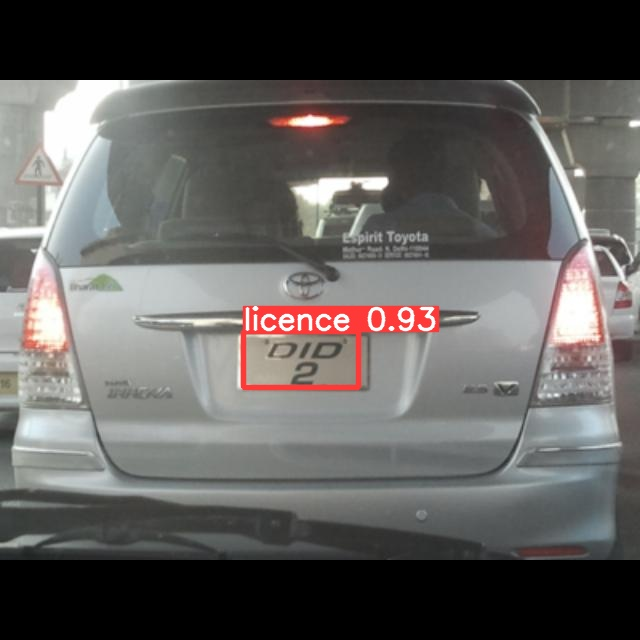

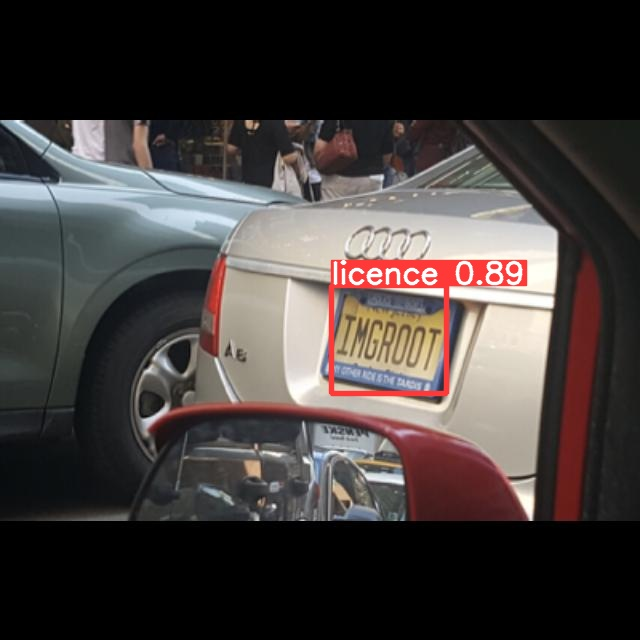

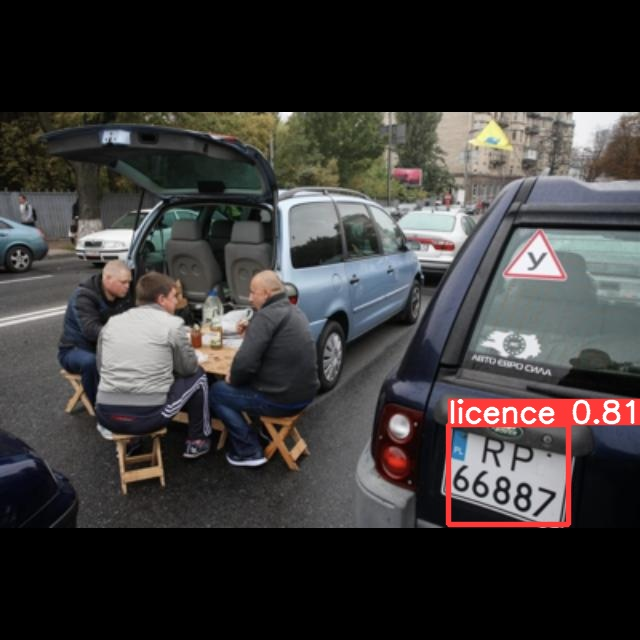

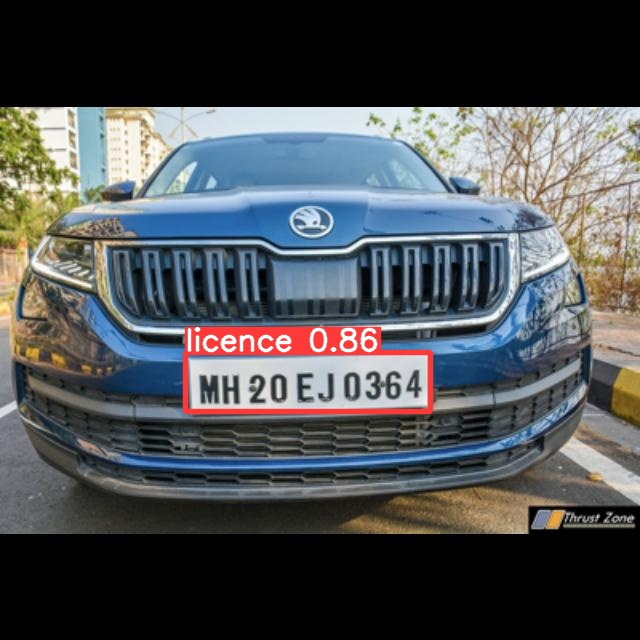

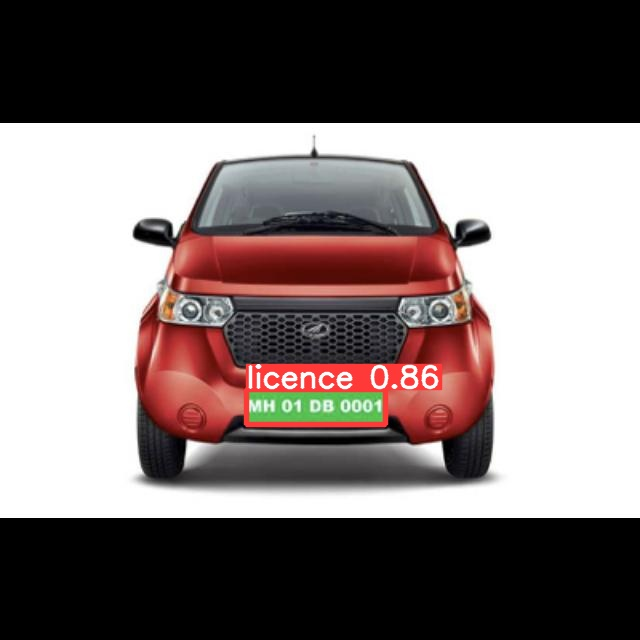

...

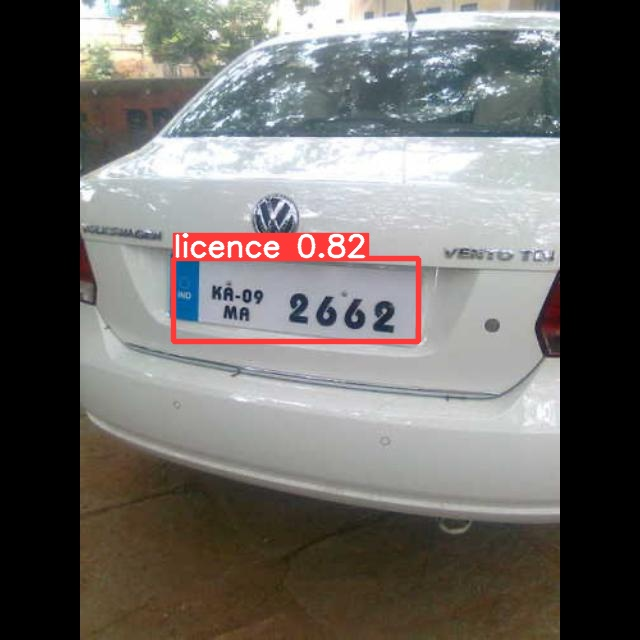

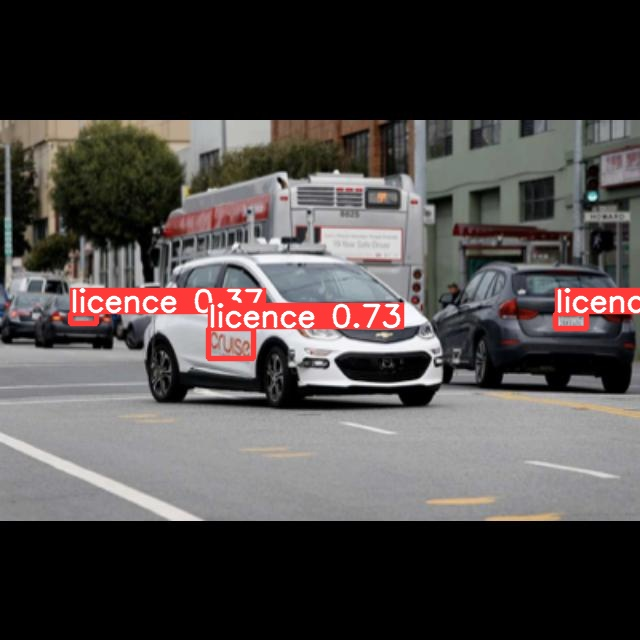

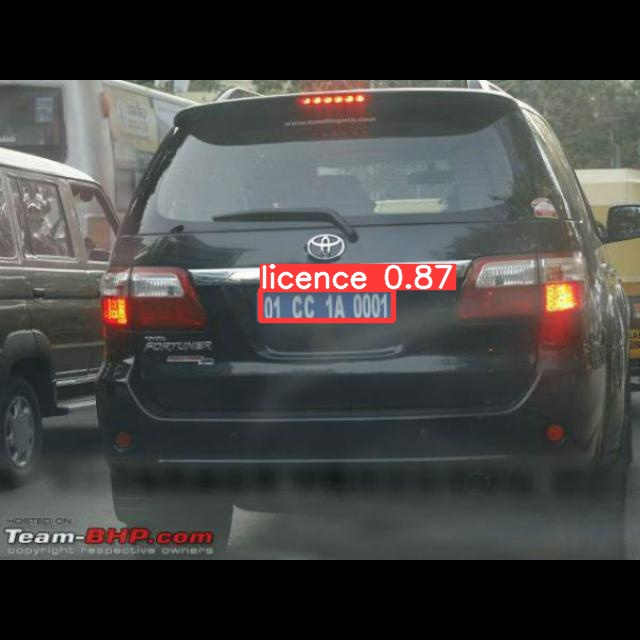

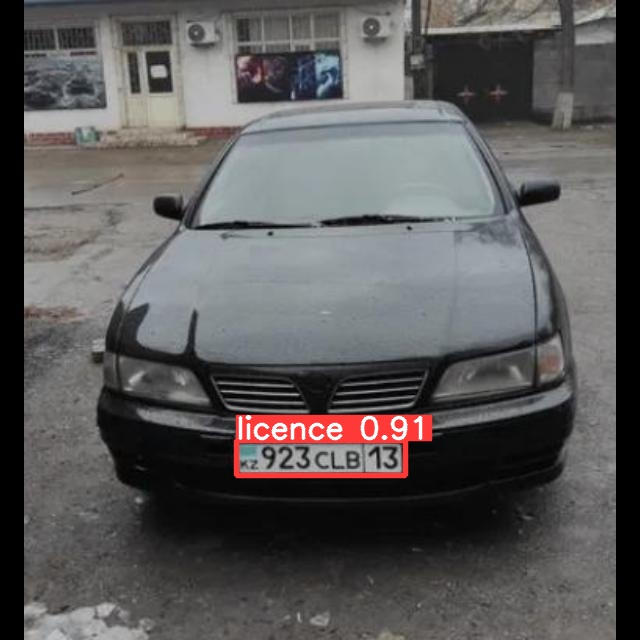

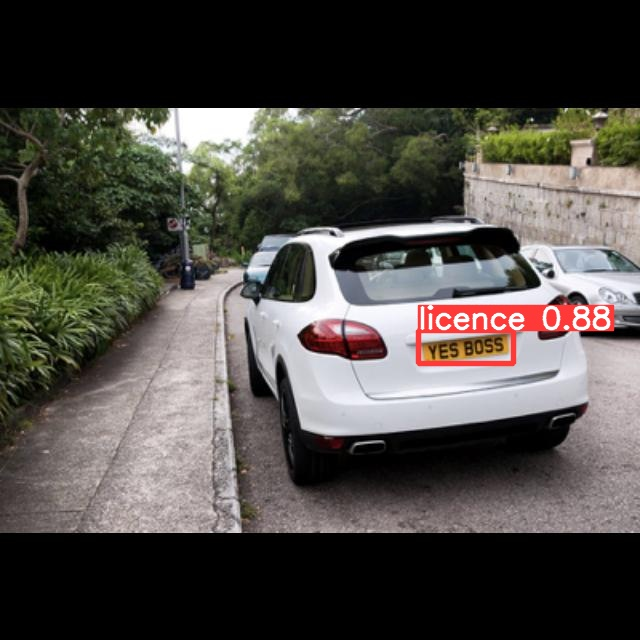

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!python /content/yolov5/detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.4 --source {dataset.location}/test/images --save-txt


detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/datasets/licence-1/test/images, data=../data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-267-gc42aba5 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/40 /content/datasets/licence-1/test/images/Cars100_png.rf.b7f972df0f57b914b14ab44a0eda8ed3.jpg: 416x416 1 licence, 7.1ms
image 2/40 /content/datasets/licence-1/test/images/Cars104_png.rf.094191d1ec06f152d5a0407ce9069591.jpg: 416x416 2 licen

In [ ]:
!python /content/yolov5/detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.4 --source {dataset.location}/test/images --save-crop

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/datasets/licence-1/test/images, data=../data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-267-gc42aba5 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/40 /content/datasets/licence-1/test/images/Cars100_png.rf.b7f972df0f57b914b14ab44a0eda8ed3.jpg: 416x416 1 licence, 9.5ms
image 2/40 /content/datasets/licence-1/test/images/Cars104_png.rf.094191d1ec06f152d5a0407ce9069591.jpg: 416x416 2 licen

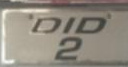

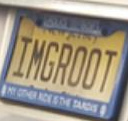

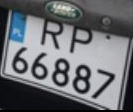

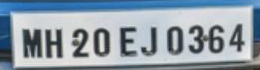

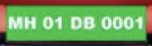

...

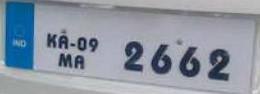

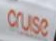

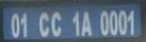

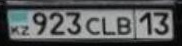

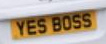

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp8/crops/licence/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!pip install pytesseract

In [ ]:
!sudo apt install tesseract-ocr

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 24 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 3s (1,874 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

In [ ]:
import pytesseract
import cv2
import numpy as np

In [ ]:
text = pytesseract.image_to_string("/content/yolov5/runs/detect/exp8/crops/licence/Cars154_png.rf.28b37af3ed5639e68719616feaace871.jpg")
print(text)


Br 2662 |



In [ ]:
#text_image=cv2.imread("/content/yolov5/runs/detect/exp8/crops/licence/Cars154_png.rf.28b37af3ed5639e68719616feaace871.jpg")
#img = cv2.cvtColor(text_image, cv2.COLOR_BGR2GRAY)


In [ ]:
#blurred = cv2.GaussianBlur(img, (7, 7), 0)
#thresh = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 21, 4)
#text = pytesseract.image_to_string(thresh, config='-l eng --psm 7')
#print(text)

Hur e662]



In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('/content/yolov5/runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>